# HOUSE PRICES

### DATA PROCESSING

In [28]:
#libraries we need
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from datetime import date
pd.options.mode.chained_assignment = None
import h2o
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt


#libraries we need
# !pip install h2o

from scipy.special import expit

from h2o.estimators.glm import H2OGeneralizedLinearEstimator
from h2o.grid.grid_search import H2OGridSearch



from sklearn.model_selection import train_test_split
from h2o.estimators import H2OGradientBoostingEstimator
SEED  = 1111   # global random seed for better reproducibility




from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus



h2o.init(max_mem_size='24G', nthreads=4) # start h2o with plenty of memory and threads
h2o.remove_all()                         # clears h2o memory
h2o.no_progress() 


Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "1.8.0_152-release"; OpenJDK Runtime Environment (build 1.8.0_152-release-1056-b12); OpenJDK 64-Bit Server VM (build 25.152-b12, mixed mode)
  Starting server from /Users/vibhz/GWU_rml/env_rml/lib/python3.6/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /var/folders/7j/xkpg12v52m9dbd2qlw0lv1tw0000gn/T/tmph6w0zz1r
  JVM stdout: /var/folders/7j/xkpg12v52m9dbd2qlw0lv1tw0000gn/T/tmph6w0zz1r/h2o_vibhz_started_from_python.out
  JVM stderr: /var/folders/7j/xkpg12v52m9dbd2qlw0lv1tw0000gn/T/tmph6w0zz1r/h2o_vibhz_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O cluster uptime:,02 secs
H2O cluster timezone:,America/Los_Angeles
H2O data parsing timezone:,UTC
H2O cluster version:,3.26.0.3
H2O cluster version age:,10 months and 1 day !!!
H2O cluster name:,H2O_from_python_vibhz_bfgmr2
H2O cluster total nodes:,1
H2O cluster free memory:,21.33 Gb
H2O cluster total cores:,8
H2O cluster allowed cores:,4
H2O cluster status:,"accepting new members, healthy"


In [2]:
train = pd.read_csv('./house-prices-data/train.csv') 
test = pd.read_csv('./house-prices-data/test.csv')

In [3]:
## DATA CLEANING AND FEATURE ENGINEERING

In [4]:
# Drop the id column from both test and training data
train.drop(['Id'],axis=1, inplace=True)
test.drop(['Id'],axis=1, inplace=True)

print('The shape of train data is {}'.format(train.shape))
print('The shape of test data is {}'.format(test.shape))

#concat both the datasets for easier cleaning 
full = train.append(test, ignore_index=True)
print('The shape of full data is {}'.format(full.shape))

The shape of train data is (1460, 80)
The shape of test data is (1459, 79)


/Users/vibhz/GWU_rml/env_rml/lib/python3.6/site-packages/pandas/core/frame.py:6211: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


The shape of full data is (2919, 80)


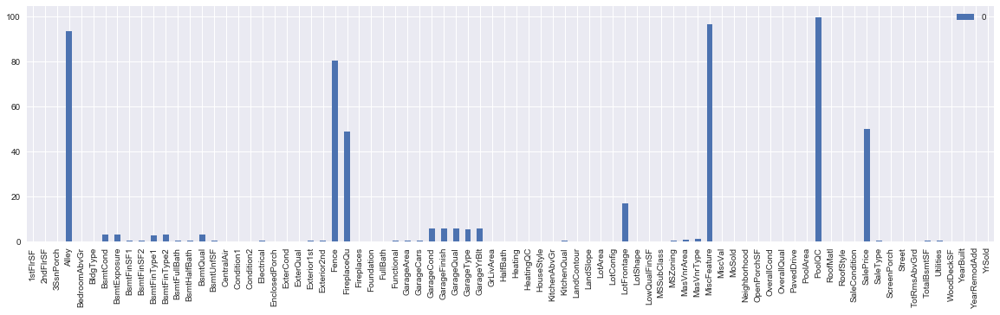

In [5]:
pd.DataFrame(full.isna().sum()*100/full.shape[0]).plot.bar(figsize=(20,5))

* The above plot gives us a summary as percent values for all the variables in the training dataset.
* For the variables with huge proportion of missing value: Alley, PoolQC, Fence and MiscFeature, it's proper to replace NA value with None. Since None is also a type
* Replaced null values with None in the FireplaceQu column both in test and training set.

In [6]:
#NA already existing category
full.update(full[['BsmtCond','BsmtFinType2','BsmtFinType1','BsmtExposure','BsmtQual','GarageType','GarageQual','GarageFinish','GarageCond','FireplaceQu','MiscFeature','Fence','PoolQC','Alley']].fillna('None'))

#none a new category generated
full.update(full[['Electrical','MasVnrType']].fillna('None'))

#nan with zero as constant
full.update(full[['BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','BsmtHalfBath','BsmtFullBath','GarageArea','GarageCars','MasVnrArea','TotalBsmtSF']].fillna(0)) #no basement so areas are zero


# Replacing the missing values with mode for the list of variables ['Exterior1st','Exterior2nd','Functional','KitchenQual','MSZoning','SaleType','Utilities']
full['Exterior1st']=full['Exterior1st'].fillna(full.Exterior1st.value_counts().index[0])
full['Exterior2nd']=full['Exterior2nd'].fillna(full.Exterior2nd.value_counts().index[0])
full['Functional']=full['Functional'].fillna(full.Functional.value_counts().index[0])
full['KitchenQual']=full['KitchenQual'].fillna(full.KitchenQual.value_counts().index[0])
full['MSZoning']=full['MSZoning'].fillna(full.MSZoning.value_counts().index[0])
full['SaleType']=full['SaleType'].fillna(full.SaleType.value_counts().index[0])
full['Utilities']=full['Utilities'].fillna(full.Utilities.value_counts().index[0])

#Dropping irrelavent columns from the whole dataset based on the EDA on the training dataset
full= full.drop(['MoSold','GarageQual','PoolArea','MSSubClass'],axis=1)

#GarageQual is repetitive
#PoolQC is mostly NA
#Pool Area is mostly 0
#MSSubClass is a combination of dweiing and year



#filled missing garage years
full['GarageYrBlt'] = full['GarageYrBlt'].fillna(full['YearBuilt'])



#converting years into age 
currentYear = datetime.now().year

full['Age_House']=currentYear-full['YearBuilt']
full['Age_Renovation']=currentYear-full['YearRemodAdd']
full['Garage_age']=currentYear-full['GarageYrBlt']
full = full.drop(['YearBuilt','YearRemodAdd','GarageYrBlt'],axis=1)



# Changing OverallCond into a categorical variable
full['OverallCond'] = full['OverallCond'].astype(str)

# Year and month sold are transformed into categorical features.
full['YrSold'] = full['YrSold'].astype(str)

In [7]:
from sklearn.preprocessing import LabelEncoder
cols = ('FireplaceQu', 'BsmtQual', 'BsmtCond', 'GarageCond', 'ExterQual', 
        'ExterCond','HeatingQC', 'PoolQC', 'KitchenQual', 'BsmtFinType1', 
        'BsmtFinType2', 'Functional', 'Fence', 'BsmtExposure', 'GarageFinish', 'LandSlope',
        'LotShape', 'PavedDrive', 'Street', 'Alley', 'CentralAir', 'OverallCond', 
        'YrSold')
# process columns, apply LabelEncoder to categorical features
for c in cols:
    lb = LabelEncoder() 
    lb.fit(list(full[c].values)) 
    full[c] = lb.transform(list(full[c].values))
    
    
    
# Adding total sqfootage feature 
full['TotalSF'] = full['TotalBsmtSF'] + full['1stFlrSF'] + full['2ndFlrSF']

In [8]:
#spillitng the data again

train = full[full['SalePrice'].notnull()]
test = full[full['SalePrice'].isnull()]

In [9]:
train_y = train['SalePrice']
train_x = train.drop(['SalePrice'],axis=1)

test_x = test.drop(['SalePrice'],axis=1)

In [10]:
# Get train LotFrontage dummy variables
LotFrontage_Dummies_df = pd.get_dummies(train_x[['LotFrontage', 'MSZoning', 'LotArea', 'LotConfig', 'Neighborhood']])

# Get full dummy variables
# Split the data into LotFrontage known and LotFrontage unknown
LotFrontageKnown = LotFrontage_Dummies_df[LotFrontage_Dummies_df["LotFrontage"].notnull()]
LotFrontageUnknown = LotFrontage_Dummies_df[LotFrontage_Dummies_df["LotFrontage"].isnull()]

# Training data knowing LotFrontage
LotFrontage_Known_X = LotFrontageKnown.drop(["LotFrontage"], axis = 1)
LotFrontage_Known_y = LotFrontageKnown["LotFrontage"]
# Training data unknown LotFrontage
LotFrontage_Unknown_X = LotFrontageUnknown.drop(["LotFrontage"], axis = 1)
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor
rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)
rfr.fit(LotFrontage_Known_X, LotFrontage_Known_y)
rfr.score(LotFrontage_Known_X, LotFrontage_Known_y)

/Users/vibhz/GWU_rml/env_rml/lib/python3.6/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


0.9305840449585167

In [11]:
# Predict training data unknown LotFrontage
LotFrontage_Unknown_y = rfr.predict(LotFrontage_Unknown_X)
train_x.loc[train_x["LotFrontage"].isnull(), "LotFrontage"] = LotFrontage_Unknown_y

In [12]:
# Repeat same process for test data
# Get train LotFrontage dummy variables
LotFrontage_Dummies_df = pd.get_dummies(test_x[['LotFrontage', 'MSZoning', 'LotArea', 'LotConfig', 'Neighborhood']])

# Get full dummy variables
# Split the data into LotFrontage known and LotFrontage unknown
LotFrontageKnown = LotFrontage_Dummies_df[LotFrontage_Dummies_df["LotFrontage"].notnull()]
LotFrontageUnknown = LotFrontage_Dummies_df[LotFrontage_Dummies_df["LotFrontage"].isnull()]

# Testing data knowing LotFrontage
LotFrontage_Known_X = LotFrontageKnown.drop(["LotFrontage"], axis = 1)
LotFrontage_Known_y = LotFrontageKnown["LotFrontage"]
# Testing data unknown LotFrontage
LotFrontage_Unknown_X = LotFrontageUnknown.drop(["LotFrontage"], axis = 1)
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor
rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)
rfr.fit(LotFrontage_Known_X, LotFrontage_Known_y)
rfr.score(LotFrontage_Known_X, LotFrontage_Known_y)

0.9456107979297688

In [13]:
# Predict testing data unknown LotFrontage
LotFrontage_Unknown_y = rfr.predict(LotFrontage_Unknown_X)
test_x.loc[test_x["LotFrontage"].isnull(), "LotFrontage"] = LotFrontage_Unknown_y

In [14]:
train['LotFrontage'] = train_x['LotFrontage']
test['LotFrontage'] = test_x['LotFrontage']

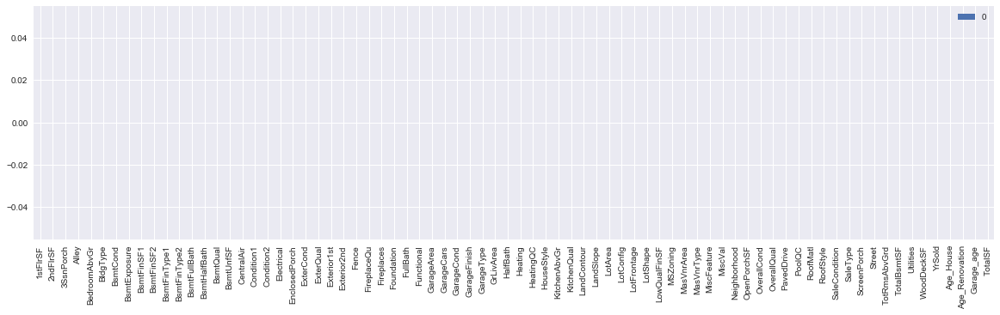

In [15]:
pd.DataFrame(train_x.isna().sum()*100/train_x.shape[0]).plot.bar(figsize=(20,5))

In [16]:
train.to_csv('processed-data/new_train.csv', index=False)
test.to_csv('processed-data/new_test.csv', index=False)

## EDA

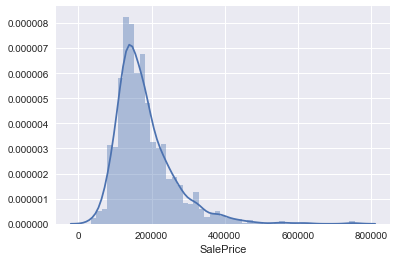

In [17]:
sns.distplot(train_y)

#Deviate from the normal distribution.
#Have appreciable positive skewness.

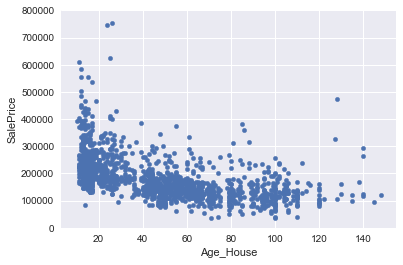

In [19]:
train_data = pd.concat([train_y, train_x], axis=1)

train_data.plot.scatter(x='Age_House', y='SalePrice', ylim=(0,800000))

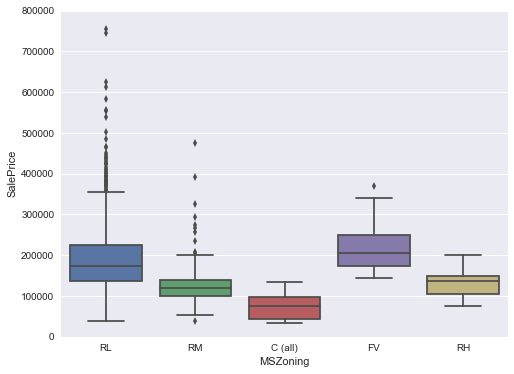

In [20]:
#box plot overallqual/saleprice
var = 'MSZoning'
data = pd.concat([train_data['SalePrice'], train_data[var]], axis=1)
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x=var, y="SalePrice", data=data)
fig.axis(ymin=0, ymax=800000);

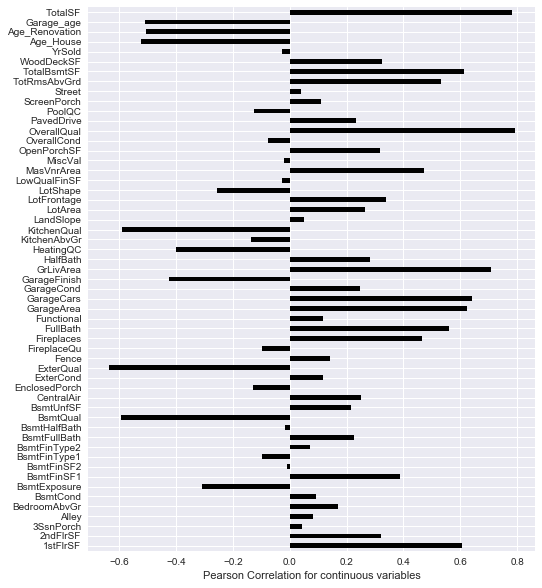

In [21]:
result = pd.concat([train_x, train_y], axis=1)
Corr = result.corr().iloc[:-1,-1]

fig, ax_ = plt.subplots(figsize=(8, 10))
_ =  Corr.plot(kind='barh', ax=ax_, colormap='gnuplot')
_ = ax_.set_xlabel('Pearson Correlation for continuous variables')

#### MODEL BUILDING

In [22]:
train = pd.read_csv('processed-data/new_train.csv') 
test = pd.read_csv('processed-data/new_test.csv')

In [23]:
train['SalePrice'] = np.log(train['SalePrice'])
test['SalePrice'] = np.log(test['SalePrice'])

train_y = train['SalePrice']
train_x = train.drop(['SalePrice'],axis=1)

test_y = test['SalePrice']
test_x = test.drop(['SalePrice'],axis=1)

## GLM

In [24]:
train_df = pd.get_dummies(train)
test_df = pd.get_dummies(test)

In [25]:
train_y_df = train_df['SalePrice']
train_x_df = train_df.drop('SalePrice', axis = 1)

In [26]:
r = 'SalePrice'
x = list(train_x_df.columns.values)

In [29]:
hf=h2o.H2OFrame(train_df)
gf=h2o.H2OFrame(test_df)

In [30]:
hyper_params = {'alpha': [0, .25, .5, .75, .1]
                ,'lambda':[1, 0.5, 0.1, 0.01, 0.001, 0.0001, 0.00001, 0]
               }

glm = H2OGeneralizedLinearEstimator(family = 'gaussian',standardize = True,lambda_search = True)

# build grid search with previously made GLM and hyperparameters
grid = H2OGridSearch(model = glm, hyper_params = hyper_params,
                     search_criteria = {'strategy': "Cartesian"})


grid.train(x = x, y = r, training_frame = hf,nfolds=5,seed=1)

In [31]:
sorted_grid = grid.get_grid(sort_by='RMSE', decreasing=False)
best_model = sorted_grid.models[0]
best_model.cross_validation_metrics_summary()


Cross-Validation Metrics Summary: 

,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,mae,0.087561086,0.007938551,0.100381434,0.0823554,0.082669824,0.09026073,0.08213804
1,mean_residual_deviance,0.019893523,0.007512644,0.024748148,0.0117970165,0.030185146,0.018082067,0.014655241
2,mse,0.019893523,0.007512644,0.024748148,0.0117970165,0.030185146,0.018082067,0.014655241
3,null_deviance,46.57937,8.305051,57.855732,35.57458,45.474777,43.385708,50.606052
4,r2,0.8746777,0.0461421,0.8728077,0.90466636,0.7987752,0.8797188,0.9174205
5,residual_deviance,5.8532844,2.366421,7.3502,3.3857436,9.146099,5.2076354,4.176744
6,rmse,0.13903934,0.02649501,0.15731545,0.10861407,0.17373873,0.13446958,0.12105884
7,rmsle,0.01064359,0.0018527234,0.012134987,0.008346687,0.012816845,0.01049446,0.009424972


In [32]:
pred_glm_tr =  best_model.predict(h2o.H2OFrame(train_x_df))

In [33]:
pred_glm_tr = pred_glm_tr.as_data_frame()

In [34]:
co = best_model.coef()

In [35]:
#feature importance for the continuous variables in glm

In [36]:
cc = [key for key in dict(train.dtypes) if dict(train.dtypes)[key] in ['float64', 'int64']]
cc.remove('SalePrice')

In [37]:
cont_coef = pd.DataFrame.from_dict(dict((k, co[k]) for k in cc),orient='index')

In [39]:
cont_coef = cont_coef.rename(columns={ 0: "Beta"})

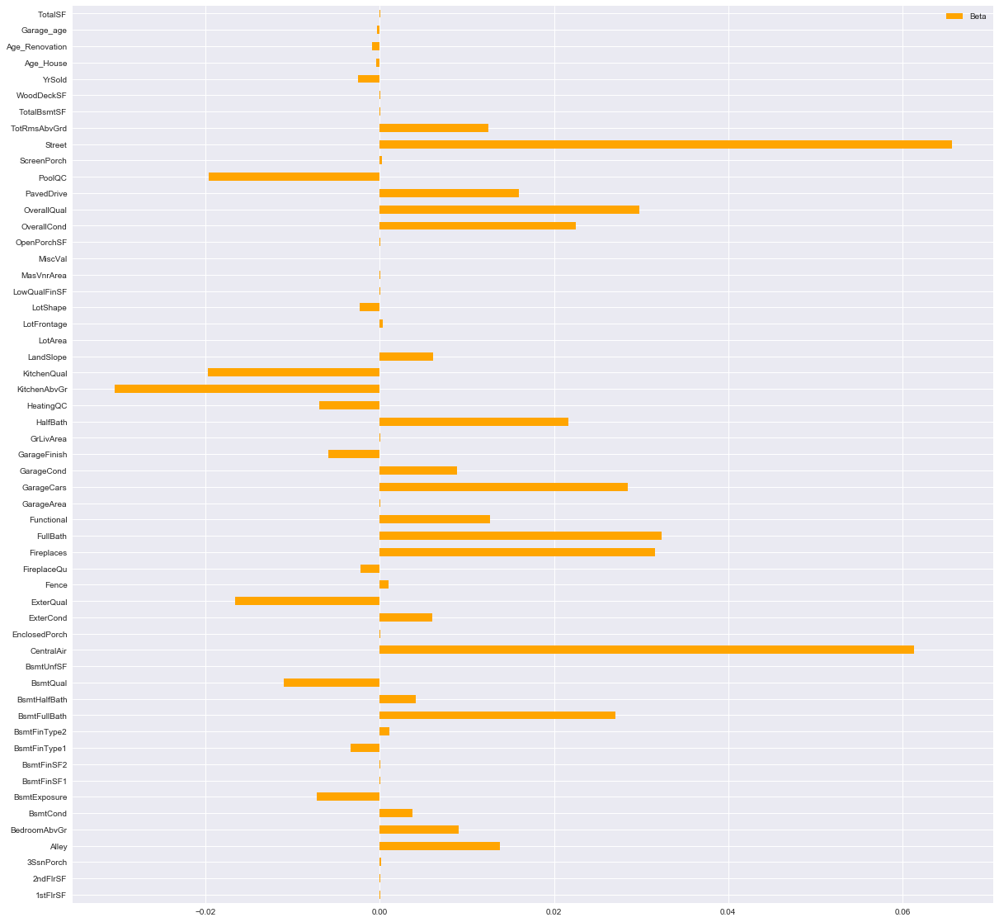

In [40]:
cont_coef.plot.barh(figsize=(20, 20),color='orange')

# GBM

In [41]:
X_train, X_valid, y_train, y_valid = train_test_split(train_x, train_y, test_size=0.30, random_state=1111)

In [42]:
X_train = pd.concat([X_train, y_train], axis=1)
X_valid = pd.concat([X_valid, y_valid], axis=1)
X_train_hf = h2o.H2OFrame(X_train)
X_valid_hf = h2o.H2OFrame(X_valid)

SEED  = 1111   # global random seed for better reproducibility


In [43]:
y_name = 'SalePrice'
x_names = list(train.columns.drop('SalePrice'))

predictors = x_names
response = "SalePrice"

In [44]:
params = {'learn_rate': [0.01, 0.05, 0.1], 
          'max_depth': list(range(2,13,2)),
          'ntrees': [20, 50, 80, 110, 140, 170, 200],
          'sample_rate': [0.5,0.6,0.7,0.9,1], 
          'col_sample_rate': [0.2,0.4,0.5,0.6,0.8,1]
          }


# Prepare the grid object
grid = H2OGridSearch(model=H2OGradientBoostingEstimator,   # Model to be trained
                     grid_id='gbm_grid1',
                     hyper_params=params,              # Dictionary of parameters
                     search_criteria={"strategy": "RandomDiscrete"}   # RandomDiscrete
                     )

# Train the Model
grid.train(x=predictors,y=response, 
           training_frame=X_train_hf, 
           validation_frame=X_valid_hf,
           seed = SEED) # Grid Search ID

In [45]:
# Identify the best model generated with least error
sorted_final_grid = grid.get_grid(sort_by='rmsle',decreasing = False)

In [46]:
best_model_id = sorted_final_grid.model_ids[0]
best_gbm_from_grid = h2o.get_model(best_model_id)
best_gbm_from_grid.summary()


Model Summary: 

,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,170.0,170.0,18365.0,2.0,2.0,2.0,3.0,4.0,3.9


In [47]:
preds_train = best_gbm_from_grid.predict(X_train_hf).exp().as_data_frame()

In [48]:
best_gbm_from_grid.model_performance(X_valid_hf)


ModelMetricsRegression: gbm
** Reported on test data. **

MSE: 0.011778798904211008
RMSE: 0.10853017508606078
MAE: 0.07577899196402749
RMSLE: 0.008407261459156386
Mean Residual Deviance: 0.011778798904211008


In [49]:
X_test_hf = h2o.H2OFrame(test_x)
preds = best_gbm_from_grid.predict(X_test_hf)
final_preds = preds.exp()
final_preds = final_preds.as_data_frame()
pred_pandas=final_preds

/Users/vibhz/GWU_rml/env_rml/lib/python3.6/site-packages/h2o/job.py:70: UserWarning: Test/Validation dataset column 'Condition2' has levels not trained on: [PosA]
  warnings.warn(w)
/Users/vibhz/GWU_rml/env_rml/lib/python3.6/site-packages/h2o/job.py:70: UserWarning: Test/Validation dataset column 'Exterior1st' has levels not trained on: [CBlock]
  warnings.warn(w)
/Users/vibhz/GWU_rml/env_rml/lib/python3.6/site-packages/h2o/job.py:70: UserWarning: Test/Validation dataset column 'Exterior2nd' has levels not trained on: [CBlock]
  warnings.warn(w)
/Users/vibhz/GWU_rml/env_rml/lib/python3.6/site-packages/h2o/job.py:70: UserWarning: Test/Validation dataset column 'MiscFeature' has levels not trained on: [Gar2]
  warnings.warn(w)
/Users/vibhz/GWU_rml/env_rml/lib/python3.6/site-packages/h2o/job.py:70: UserWarning: Test/Validation dataset column 'RoofStyle' has levels not trained on: [Shed]
  warnings.warn(w)


In [51]:
raw_test = pd.read_csv('house-prices-data/test.csv')
raw_id = raw_test['Id']
output = pd.concat([raw_id, final_preds], axis=1)
output = output.rename(columns={'exp(predict)': "SalePrice"})

In [52]:
output.to_csv('results.csv', index=False)

## INTERPRITIBILITY

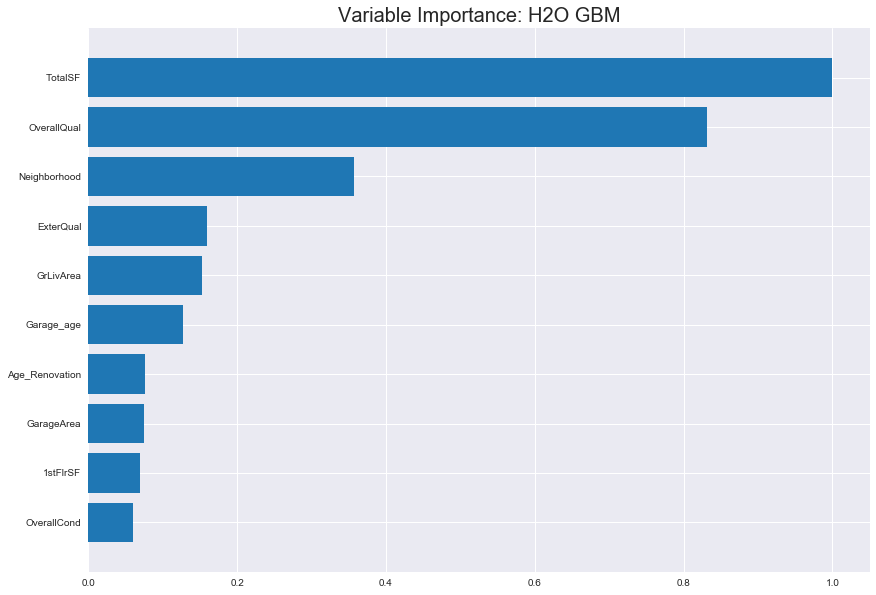

In [53]:
best_gbm_from_grid.varimp_plot()

### SHAPLEY VALUES

In [54]:
contributions = best_gbm_from_grid.predict_contributions(X_test_hf)
#contributions.head(5)

In [55]:
import shap
shap.initjs()
contributions_matrix = contributions.as_data_frame().as_matrix()

X = list(train.columns)
X.remove('SalePrice')
len(X)


/Users/vibhz/GWU_rml/env_rml/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  This is separate from the ipykernel package so we can avoid doing imports until


76

In [56]:
shap_values = contributions_matrix[:,:76]
shap_values.shape



(1459, 76)

In [57]:
expected_value = contributions_matrix[:,:76].min()
expected_value

-0.2488324195146561

In [58]:
shap.force_plot(expected_value, shap_values, X)


In [59]:
shap.force_plot(expected_value, shap_values[0,:], X)

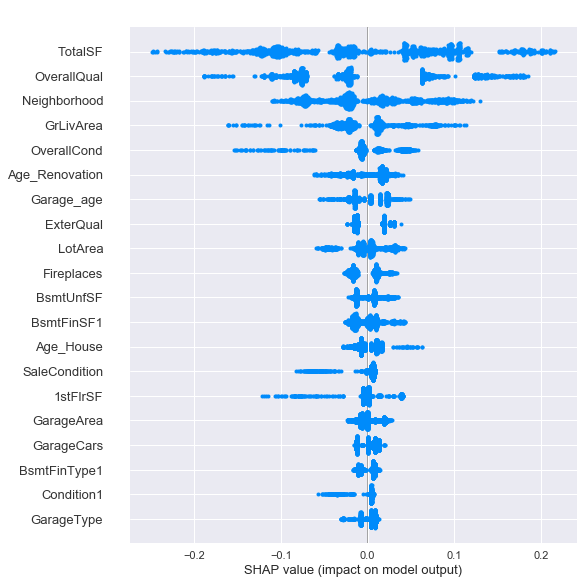

In [60]:
shap.summary_plot(shap_values, X)

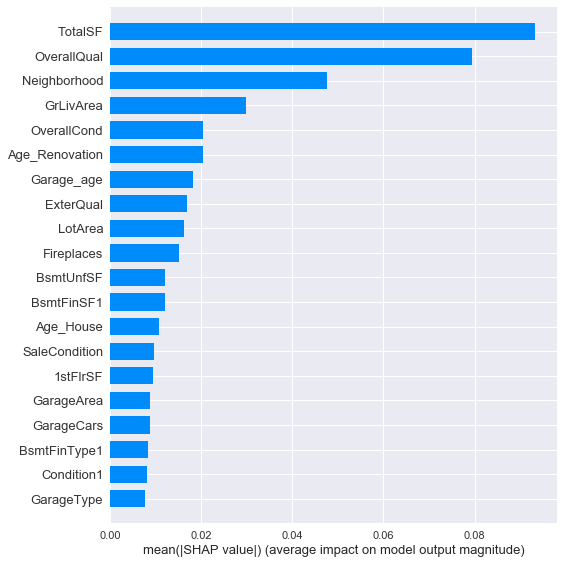

In [61]:
shap.summary_plot(shap_values, X, plot_type="bar")


### PARTIAL DEPENDENCE

In [62]:
Continuous = [key for key in dict(train.dtypes) if dict(train.dtypes)[key] in ['float64', 'int64']]


PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column '1stFlrSF'


,1stflrsf,mean_response,stddev_response,std_error_mean_response
0,334.000000,11.939774,0.391668,0.012252
1,563.368421,11.950907,0.391443,0.012245
2,792.736842,12.024157,0.375864,0.011757
3,1022.105263,12.024157,0.375864,0.011757
4,1251.473684,12.024157,0.375864,0.011757
5,1480.842105,12.024157,0.375864,0.011757
6,1710.210526,12.052084,0.397715,0.012441
7,1939.578947,12.051841,0.397338,0.012429
8,2168.947368,12.051841,0.397338,0.012429
9,2398.315789,12.051841,0.397338,0.012429


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column '2ndFlrSF'


,2ndflrsf,mean_response,stddev_response,std_error_mean_response
0,0.000000,12.022934,0.385654,0.012063
1,108.684211,12.022934,0.385654,0.012063
2,217.368421,12.022934,0.385654,0.012063
3,326.052632,12.022934,0.385654,0.012063
4,434.736842,12.022934,0.385654,0.012063
5,543.421053,12.026553,0.385808,0.012068
6,652.105263,12.026873,0.385451,0.012057
7,760.789474,12.026873,0.385451,0.012057
8,869.473684,12.026873,0.385451,0.012057
9,978.157895,12.026873,0.385451,0.012057


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column '3SsnPorch'


,3ssnporch,mean_response,stddev_response,std_error_mean_response
0,0.000000,12.026141,0.388372,0.012148
1,26.736842,12.026141,0.388372,0.012148
2,53.473684,12.026141,0.388372,0.012148
3,80.210526,12.026141,0.388372,0.012148
4,106.947368,12.026141,0.388372,0.012148
5,133.684211,12.026141,0.388372,0.012148
6,160.421053,12.026141,0.388372,0.012148
7,187.157895,12.026141,0.388372,0.012148
8,213.894737,12.026141,0.388372,0.012148
9,240.631579,12.026141,0.388372,0.012148


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'Alley'


,alley,mean_response,stddev_response,std_error_mean_response
0,0.0,12.026049,0.388385,0.012149
1,1.0,12.026049,0.388385,0.012149
2,2.0,12.029643,0.387381,0.012117


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'BedroomAbvGr'


,bedroomabvgr,mean_response,stddev_response,std_error_mean_response
0,0.0,12.008327,0.391124,0.012235
1,1.0,12.008327,0.391124,0.012235
2,2.0,12.025458,0.388488,0.012152
3,3.0,12.026891,0.386366,0.012086
4,4.0,12.028539,0.387539,0.012122
5,5.0,12.022314,0.387192,0.012112
6,6.0,12.022314,0.387192,0.012112
7,7.0,12.022314,0.387192,0.012112
8,8.0,12.022314,0.387192,0.012112


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'BsmtCond'


,bsmtcond,mean_response,stddev_response,std_error_mean_response
0,0.0,12.026141,0.388372,0.012148
1,1.0,12.026141,0.388372,0.012148
2,2.0,12.026141,0.388372,0.012148
3,3.0,12.026141,0.388372,0.012148
4,4.0,12.026141,0.388372,0.012148


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'BsmtExposure'


,bsmtexposure,mean_response,stddev_response,std_error_mean_response
0,0.0,12.030424,0.388215,0.012144
1,1.0,12.030424,0.388215,0.012144
2,2.0,12.030424,0.388215,0.012144
3,3.0,12.023985,0.387083,0.012108
4,4.0,12.023985,0.387083,0.012108


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'BsmtFinSF1'


,bsmtfinsf1,mean_response,stddev_response,std_error_mean_response
0,0.000000,12.010208,0.382161,0.011954
1,297.052632,12.027153,0.380225,0.011894
2,594.105263,12.031150,0.376303,0.011771
3,891.157895,12.031150,0.376303,0.011771
4,1188.210526,12.048182,0.389798,0.012193
5,1485.263158,12.058246,0.391010,0.012231
6,1782.315789,12.047152,0.389215,0.012175
7,2079.368421,12.047152,0.389215,0.012175
8,2376.421053,12.047152,0.389215,0.012175
9,2673.473684,12.047152,0.389215,0.012175


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'BsmtFinSF2'


,bsmtfinsf2,mean_response,stddev_response,std_error_mean_response
0,0.000000,12.026048,0.38836,0.012148
1,59.315789,12.026048,0.38836,0.012148
2,118.631579,12.026048,0.38836,0.012148
3,177.947368,12.026048,0.38836,0.012148
4,237.263158,12.026048,0.38836,0.012148
5,296.578947,12.026048,0.38836,0.012148
6,355.894737,12.026048,0.38836,0.012148
7,415.210526,12.026048,0.38836,0.012148
8,474.526316,12.026048,0.38836,0.012148
9,533.842105,12.026048,0.38836,0.012148


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'BsmtFinType1'


,bsmtfintype1,mean_response,stddev_response,std_error_mean_response
0,0.0,12.033672,0.385496,0.012059
1,1.0,12.033672,0.385496,0.012059
2,2.0,12.033672,0.385496,0.012059
3,3.0,12.019574,0.385519,0.012059
4,4.0,12.019574,0.385519,0.012059
5,5.0,12.019574,0.385519,0.012059
6,6.0,12.016604,0.386224,0.012081


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'BsmtFinType2'


,bsmtfintype2,mean_response,stddev_response,std_error_mean_response
0,0.0,12.026141,0.388372,0.012148
1,1.0,12.026141,0.388372,0.012148
2,2.0,12.026141,0.388372,0.012148
3,3.0,12.026141,0.388372,0.012148
4,4.0,12.026141,0.388372,0.012148
5,5.0,12.026141,0.388372,0.012148
6,6.0,12.026141,0.388372,0.012148


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'BsmtFullBath'


,bsmtfullbath,mean_response,stddev_response,std_error_mean_response
0,0.0,12.023937,0.388690,0.012158
1,1.0,12.029676,0.386465,0.012089
2,2.0,12.035552,0.386144,0.012079
3,3.0,12.035552,0.386144,0.012079


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'BsmtHalfBath'


,bsmthalfbath,mean_response,stddev_response,std_error_mean_response
0,0.0,12.026141,0.388372,0.012148
1,1.0,12.026141,0.388372,0.012148
2,2.0,12.026141,0.388372,0.012148


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'BsmtQual'


,bsmtqual,mean_response,stddev_response,std_error_mean_response
0,0.0,12.044213,0.396996,0.012418
1,1.0,12.023398,0.382235,0.011957
2,2.0,12.023398,0.382235,0.011957
3,3.0,12.022499,0.382761,0.011973
4,4.0,12.022499,0.382761,0.011973


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'BsmtUnfSF'


,bsmtunfsf,mean_response,stddev_response,std_error_mean_response
0,0.000000,12.050739,0.389571,0.012186
1,122.947368,12.040186,0.391431,0.012244
2,245.894737,12.034066,0.390917,0.012228
3,368.842105,12.034066,0.390917,0.012228
4,491.789474,12.026447,0.389686,0.012190
5,614.736842,12.012748,0.388875,0.012164
6,737.684211,12.012748,0.388875,0.012164
7,860.631579,12.012748,0.388875,0.012164
8,983.578947,12.012748,0.388875,0.012164
9,1106.526316,12.012748,0.388875,0.012164


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'CentralAir'


,centralair,mean_response,stddev_response,std_error_mean_response
0,0.0,11.997191,0.394112,0.012328
1,1.0,12.029326,0.383266,0.011989


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'EnclosedPorch'


,enclosedporch,mean_response,stddev_response,std_error_mean_response
0,0.000000,12.026243,0.388360,0.012148
1,20.315789,12.026243,0.388360,0.012148
2,40.631579,12.026243,0.388360,0.012148
3,60.947368,12.025877,0.388314,0.012147
4,81.263158,12.025877,0.388314,0.012147
5,101.578947,12.025877,0.388314,0.012147
6,121.894737,12.025877,0.388314,0.012147
7,142.210526,12.025877,0.388314,0.012147
8,162.526316,12.025877,0.388314,0.012147
9,182.842105,12.025877,0.388314,0.012147


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'ExterCond'


,extercond,mean_response,stddev_response,std_error_mean_response
0,0.0,12.023913,0.388143,0.012141
1,1.0,12.023913,0.388143,0.012141
2,2.0,12.023913,0.388143,0.012141
3,3.0,12.026378,0.388306,0.012146
4,4.0,12.026378,0.388306,0.012146


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'ExterQual'


,exterqual,mean_response,stddev_response,std_error_mean_response
0,0.0,12.046556,0.376248,0.011769
1,1.0,12.046556,0.376248,0.011769
2,2.0,12.046556,0.376248,0.011769
3,3.0,12.014446,0.377832,0.011819


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'Fence'


,fence,mean_response,stddev_response,std_error_mean_response
0,0.0,12.026141,0.388372,0.012148
1,1.0,12.026141,0.388372,0.012148
2,2.0,12.026141,0.388372,0.012148
3,3.0,12.026141,0.388372,0.012148
4,4.0,12.026141,0.388372,0.012148


[]


/Users/vibhz/GWU_rml/env_rml/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)



PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'FireplaceQu'


,fireplacequ,mean_response,stddev_response,std_error_mean_response
0,0.0,12.025501,0.388733,0.012160
1,1.0,12.025501,0.388733,0.012160
2,2.0,12.025501,0.388733,0.012160
3,3.0,12.026322,0.388372,0.012149
4,4.0,12.026322,0.388372,0.012149
5,5.0,12.026322,0.388372,0.012149


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'Fireplaces'


,fireplaces,mean_response,stddev_response,std_error_mean_response
0,0.0,12.008611,0.376218,0.011768
1,1.0,12.035834,0.381545,0.011935
2,2.0,12.050239,0.380324,0.011897
3,3.0,12.050239,0.380324,0.011897


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'FullBath'


,fullbath,mean_response,stddev_response,std_error_mean_response
0,0.0,12.025024,0.386249,0.012082
1,1.0,12.025024,0.386249,0.012082
2,2.0,12.025024,0.386249,0.012082
3,3.0,12.060708,0.397893,0.012446


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'Functional'


,functional,mean_response,stddev_response,std_error_mean_response
0,0.0,11.955333,0.390878,0.012227
1,1.0,11.955333,0.390878,0.012227
2,2.0,11.995741,0.385181,0.012049
3,3.0,11.995741,0.385181,0.012049
4,4.0,11.995741,0.385181,0.012049
5,5.0,12.029178,0.386756,0.012098
6,6.0,12.029178,0.386756,0.012098


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'GarageArea'


,garagearea,mean_response,stddev_response,std_error_mean_response
0,0.000000,12.014601,0.379440,0.011869
1,74.631579,12.014601,0.379440,0.011869
2,149.263158,12.014186,0.379705,0.011877
3,223.894737,12.015039,0.379192,0.011861
4,298.526316,12.014836,0.376899,0.011790
5,373.157895,12.014836,0.376899,0.011790
6,447.789474,12.023738,0.377321,0.011803
7,522.421053,12.024434,0.377417,0.011806
8,597.052632,12.024434,0.377417,0.011806
9,671.684211,12.040726,0.389739,0.012191


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'GarageCars'


,garagecars,mean_response,stddev_response,std_error_mean_response
0,0.0,12.015442,0.387016,0.012106
1,1.0,12.015442,0.387016,0.012106
2,2.0,12.031981,0.377955,0.011823
3,3.0,12.039377,0.383720,0.012003
4,4.0,12.039377,0.383720,0.012003


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'GarageCond'


,garagecond,mean_response,stddev_response,std_error_mean_response
0,0.0,12.014713,0.396987,0.012418
1,1.0,12.014713,0.396987,0.012418
2,2.0,12.014713,0.396987,0.012418
3,3.0,12.014713,0.396987,0.012418
4,4.0,12.014713,0.396987,0.012418
5,5.0,12.028373,0.385142,0.012047


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'GarageFinish'


,garagefinish,mean_response,stddev_response,std_error_mean_response
0,0.0,12.029311,0.387886,0.012133
1,1.0,12.029311,0.387886,0.012133
2,2.0,12.029311,0.387886,0.012133
3,3.0,12.019386,0.383967,0.012011


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'GrLivArea'


,grlivarea,mean_response,stddev_response,std_error_mean_response
0,334.000000,11.912813,0.370719,0.011596
1,613.368421,11.912813,0.370719,0.011596
2,892.736842,11.987805,0.358122,0.011202
3,1172.105263,12.005222,0.355222,0.011112
4,1451.473684,12.005222,0.355222,0.011112
5,1730.842105,12.037874,0.354114,0.011077
6,2010.210526,12.065630,0.365066,0.011419
7,2289.578947,12.066265,0.365362,0.011429
8,2568.947368,12.094053,0.367680,0.011501
9,2848.315789,12.116868,0.367845,0.011506


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'HalfBath'


,halfbath,mean_response,stddev_response,std_error_mean_response
0,0.0,12.022728,0.386774,0.012099
1,1.0,12.032242,0.386556,0.012092
2,2.0,12.032242,0.386556,0.012092


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'HeatingQC'


,heatingqc,mean_response,stddev_response,std_error_mean_response
0,0.0,12.029226,0.386652,0.012095
1,1.0,12.025134,0.386443,0.012088
2,2.0,12.025134,0.386443,0.012088
3,3.0,12.021954,0.385893,0.012071
4,4.0,12.020434,0.385818,0.012069


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'KitchenAbvGr'


,kitchenabvgr,mean_response,stddev_response,std_error_mean_response
0,1.0,12.026687,0.388093,0.012140
1,2.0,12.012989,0.385304,0.012053
2,3.0,12.012989,0.385304,0.012053


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'KitchenQual'


,kitchenqual,mean_response,stddev_response,std_error_mean_response
0,0.0,12.043201,0.393928,0.012322
1,1.0,12.027951,0.381632,0.011938
2,2.0,12.027951,0.381632,0.011938
3,3.0,12.019858,0.381773,0.011942


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'LandSlope'


,landslope,mean_response,stddev_response,std_error_mean_response
0,0.0,12.026141,0.388372,0.012148
1,1.0,12.026141,0.388372,0.012148
2,2.0,12.026141,0.388372,0.012148


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'LotArea'


,lotarea,mean_response,stddev_response,std_error_mean_response
0,1300.000000,11.982659,0.374492,0.011714
1,12560.263158,12.051218,0.383894,0.012008
2,23820.526316,12.054044,0.385160,0.012048
3,35080.789474,12.048638,0.386199,0.012081
4,46341.052632,12.059887,0.386224,0.012081
5,57601.315789,12.059887,0.386224,0.012081
6,68861.578947,12.059887,0.386224,0.012081
7,80121.842105,12.059887,0.386224,0.012081
8,91382.105263,12.059887,0.386224,0.012081
9,102642.368421,12.059887,0.386224,0.012081


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'LotFrontage'


,lotfrontage,mean_response,stddev_response,std_error_mean_response
0,21.000000,12.025555,0.388713,0.012159
1,36.368421,12.025555,0.388713,0.012159
2,51.736842,12.025555,0.388713,0.012159
3,67.105263,12.026546,0.388278,0.012146
4,82.473684,12.026087,0.388574,0.012155
5,97.842105,12.026087,0.388574,0.012155
6,113.210526,12.026087,0.388574,0.012155
7,128.578947,12.019514,0.388915,0.012165
8,143.947368,12.028681,0.388417,0.012150
9,159.315789,12.028681,0.388417,0.012150


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'LotShape'


,lotshape,mean_response,stddev_response,std_error_mean_response
0,0.0,12.026263,0.388549,0.012154
1,1.0,12.026064,0.388250,0.012145
2,2.0,12.026064,0.388250,0.012145
3,3.0,12.026064,0.388250,0.012145


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'LowQualFinSF'


,lowqualfinsf,mean_response,stddev_response,std_error_mean_response
0,0.000000,12.026141,0.388372,0.012148
1,30.105263,12.026141,0.388372,0.012148
2,60.210526,12.026141,0.388372,0.012148
3,90.315789,12.026141,0.388372,0.012148
4,120.421053,12.026141,0.388372,0.012148
5,150.526316,12.026141,0.388372,0.012148
6,180.631579,12.026141,0.388372,0.012148
7,210.736842,12.026141,0.388372,0.012148
8,240.842105,12.026141,0.388372,0.012148
9,270.947368,12.026141,0.388372,0.012148


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'MasVnrArea'


,masvnrarea,mean_response,stddev_response,std_error_mean_response
0,0.000000,12.026257,0.388259,0.012145
1,72.526316,12.026257,0.388259,0.012145
2,145.052632,12.026257,0.388259,0.012145
3,217.578947,12.026257,0.388259,0.012145
4,290.105263,12.023780,0.388484,0.012152
5,362.631579,12.023780,0.388484,0.012152
6,435.157895,12.023780,0.388484,0.012152
7,507.684211,12.023780,0.388484,0.012152
8,580.210526,12.023780,0.388484,0.012152
9,652.736842,12.023780,0.388484,0.012152


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'MiscVal'


,miscval,mean_response,stddev_response,std_error_mean_response
0,0.000000,12.026141,0.388372,0.012148
1,184.210526,12.026141,0.388372,0.012148
2,368.421053,12.026141,0.388372,0.012148
3,552.631579,12.026141,0.388372,0.012148
4,736.842105,12.026141,0.388372,0.012148
5,921.052632,12.026141,0.388372,0.012148
6,1105.263158,12.026141,0.388372,0.012148
7,1289.473684,12.026141,0.388372,0.012148
8,1473.684211,12.026141,0.388372,0.012148
9,1657.894737,12.026141,0.388372,0.012148


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'OpenPorchSF'


,openporchsf,mean_response,stddev_response,std_error_mean_response
0,0.000000,12.023216,0.386520,0.012091
1,27.526316,12.023216,0.386520,0.012091
2,55.052632,12.025689,0.386660,0.012095
3,82.578947,12.035409,0.385696,0.012065
4,110.105263,12.035409,0.385696,0.012065
5,137.631579,12.035409,0.385696,0.012065
6,165.157895,12.035409,0.385696,0.012065
7,192.684211,12.038214,0.385905,0.012071
8,220.210526,12.042304,0.384753,0.012035
9,247.736842,12.042304,0.384753,0.012035


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'OverallCond'


,overallcond,mean_response,stddev_response,std_error_mean_response
0,1.0,11.914438,0.411204,0.012863
1,2.0,11.914438,0.411204,0.012863
2,3.0,11.944404,0.410282,0.012834
3,4.0,12.017141,0.384004,0.012012
4,5.0,12.037929,0.381096,0.011921
5,6.0,12.067599,0.381435,0.011932
6,7.0,12.067599,0.381435,0.011932
7,8.0,12.067599,0.381435,0.011932


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'OverallQual'


,overallqual,mean_response,stddev_response,std_error_mean_response
0,1.0,11.879609,0.326483,0.010213
1,2.0,11.879609,0.326483,0.010213
2,3.0,11.879609,0.326483,0.010213
3,4.0,11.933933,0.324944,0.010164
4,5.0,11.952485,0.315495,0.009869
5,6.0,12.006055,0.321770,0.010065
6,7.0,12.097429,0.311476,0.009743
7,8.0,12.157930,0.312087,0.009762
8,9.0,12.187988,0.311958,0.009758
9,10.0,12.187988,0.311958,0.009758


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'PavedDrive'


,paveddrive,mean_response,stddev_response,std_error_mean_response
0,0.0,12.019306,0.394565,0.012342
1,1.0,12.027155,0.386654,0.012095
2,2.0,12.027155,0.386654,0.012095


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'PoolQC'


,poolqc,mean_response,stddev_response,std_error_mean_response
0,0.0,12.026141,0.388372,0.012148
1,1.0,12.026141,0.388372,0.012148
2,2.0,12.026141,0.388372,0.012148
3,3.0,12.026141,0.388372,0.012148


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'SalePrice'


,saleprice,mean_response,stddev_response,std_error_mean_response
0,10.460242,12.026141,0.388372,0.012148
1,10.622044,12.026141,0.388372,0.012148
2,10.783845,12.026141,0.388372,0.012148
3,10.945647,12.026141,0.388372,0.012148
4,11.107449,12.026141,0.388372,0.012148
5,11.269250,12.026141,0.388372,0.012148
6,11.431052,12.026141,0.388372,0.012148
7,11.592853,12.026141,0.388372,0.012148
8,11.754655,12.026141,0.388372,0.012148
9,11.916457,12.026141,0.388372,0.012148


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'ScreenPorch'


,screenporch,mean_response,stddev_response,std_error_mean_response
0,0.000000,12.024036,0.387083,0.012108
1,23.157895,12.024036,0.387083,0.012108
2,46.315789,12.024036,0.387083,0.012108
3,69.473684,12.024036,0.387083,0.012108
4,92.631579,12.024036,0.387083,0.012108
5,115.789474,12.024036,0.387083,0.012108
6,138.947368,12.046751,0.390339,0.012210
7,162.105263,12.059336,0.389829,0.012194
8,185.263158,12.059336,0.389829,0.012194
9,208.421053,12.059336,0.389829,0.012194


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'Street'


,street,mean_response,stddev_response,std_error_mean_response
0,0.0,12.026141,0.388372,0.012148
1,1.0,12.026141,0.388372,0.012148


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'TotRmsAbvGrd'


,totrmsabvgrd,mean_response,stddev_response,std_error_mean_response
0,2.0,12.024673,0.385673,0.012064
1,3.0,12.024673,0.385673,0.012064
2,4.0,12.024673,0.385673,0.012064
3,5.0,12.024673,0.385673,0.012064
4,6.0,12.024673,0.385673,0.012064
5,7.0,12.024673,0.385673,0.012064
6,8.0,12.024673,0.385673,0.012064
7,9.0,12.024673,0.385673,0.012064
8,10.0,12.043381,0.397850,0.012445
9,11.0,12.040538,0.398829,0.012476


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'TotalBsmtSF'


,totalbsmtsf,mean_response,stddev_response,std_error_mean_response
0,0.000000,12.024114,0.388104,0.012140
1,321.578947,12.024114,0.388104,0.012140
2,643.157895,12.025095,0.387522,0.012122
3,964.736842,12.026081,0.386153,0.012079
4,1286.315789,12.026081,0.386153,0.012079
5,1607.894737,12.026081,0.386153,0.012079
6,1929.473684,12.029421,0.387825,0.012131
7,2251.052632,12.062739,0.390481,0.012214
8,2572.631579,12.062739,0.390481,0.012214
9,2894.210526,12.062739,0.390481,0.012214


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'WoodDeckSF'


,wooddecksf,mean_response,stddev_response,std_error_mean_response
0,0.000000,12.021962,0.386807,0.012100
1,38.315789,12.021962,0.386807,0.012100
2,76.631579,12.026746,0.385670,0.012064
3,114.947368,12.026746,0.385670,0.012064
4,153.263158,12.026746,0.385670,0.012064
5,191.578947,12.026746,0.385670,0.012064
6,229.894737,12.038260,0.386108,0.012078
7,268.210526,12.038260,0.386108,0.012078
8,306.526316,12.038260,0.386108,0.012078
9,344.842105,12.038260,0.386108,0.012078


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'YrSold'


,yrsold,mean_response,stddev_response,std_error_mean_response
0,0.0,12.028130,0.387448,0.012120
1,1.0,12.028130,0.387448,0.012120
2,2.0,12.028130,0.387448,0.012120
3,3.0,12.022392,0.389489,0.012183
4,4.0,12.022392,0.389489,0.012183


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'Age_House'


,age_house,mean_response,stddev_response,std_error_mean_response
0,10.000000,12.089721,0.374449,0.011713
1,17.105263,12.034291,0.379485,0.011871
2,24.210526,12.034291,0.379485,0.011871
3,31.315789,12.034291,0.379485,0.011871
4,38.421053,12.019542,0.378074,0.011826
5,45.526316,12.019542,0.378074,0.011826
6,52.631579,12.019542,0.378074,0.011826
7,59.736842,12.019542,0.378074,0.011826
8,66.842105,12.018780,0.379174,0.011861
9,73.947368,12.012657,0.378167,0.011829


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'Age_Renovation'


,age_renovation,mean_response,stddev_response,std_error_mean_response
0,10.000000,12.056007,0.372175,0.011642
1,13.157895,12.043131,0.373838,0.011694
2,16.315789,12.043131,0.373838,0.011694
3,19.473684,12.043131,0.373838,0.011694
4,22.631579,12.043131,0.373838,0.011694
5,25.789474,12.043131,0.373838,0.011694
6,28.947368,12.030497,0.373692,0.011689
7,32.105263,12.030497,0.373692,0.011689
8,35.263158,12.030497,0.373692,0.011689
9,38.421053,12.018633,0.371379,0.011617


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'Garage_age'


,garage_age,mean_response,stddev_response,std_error_mean_response
0,10.000000,12.066706,0.375359,0.011741
1,17.105263,12.044913,0.374275,0.011708
2,24.210526,12.044913,0.374275,0.011708
3,31.315789,12.044913,0.374275,0.011708
4,38.421053,12.023478,0.368649,0.011532
5,45.526316,12.023478,0.368649,0.011532
6,52.631579,12.009784,0.377539,0.011810
7,59.736842,12.011057,0.377578,0.011811
8,66.842105,12.011057,0.377578,0.011811
9,73.947368,12.011057,0.377578,0.011811


[]

PartialDependence: Partial Dependence Plot of model gbm_grid1_model_502 on column 'TotalSF'


,totalsf,mean_response,stddev_response,std_error_mean_response
0,334.000000,11.829254,0.315190,0.009859
1,934.947368,11.829254,0.315190,0.009859
2,1535.894737,11.863060,0.316107,0.009888
3,2136.842105,11.954712,0.288459,0.009023
4,2737.789474,12.082431,0.284277,0.008892
5,3338.736842,12.119993,0.305744,0.009564
6,3939.684211,12.191315,0.309323,0.009676
7,4540.631579,12.212692,0.310356,0.009708
8,5141.578947,12.212692,0.310356,0.009708
9,5742.526316,12.212692,0.310356,0.009708


[]


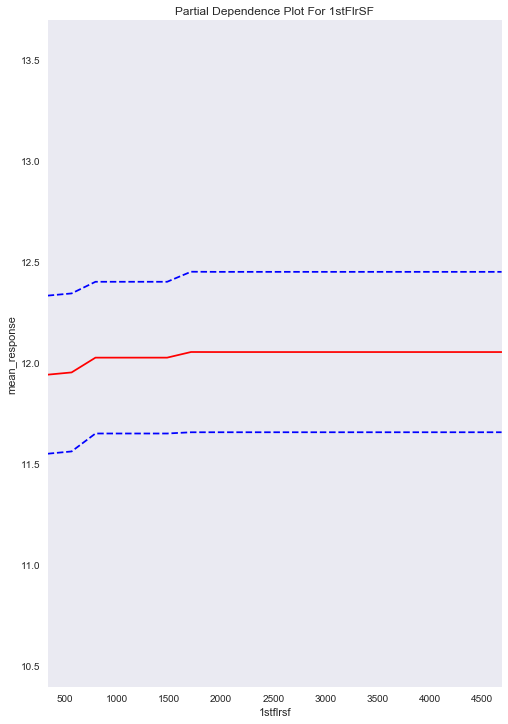

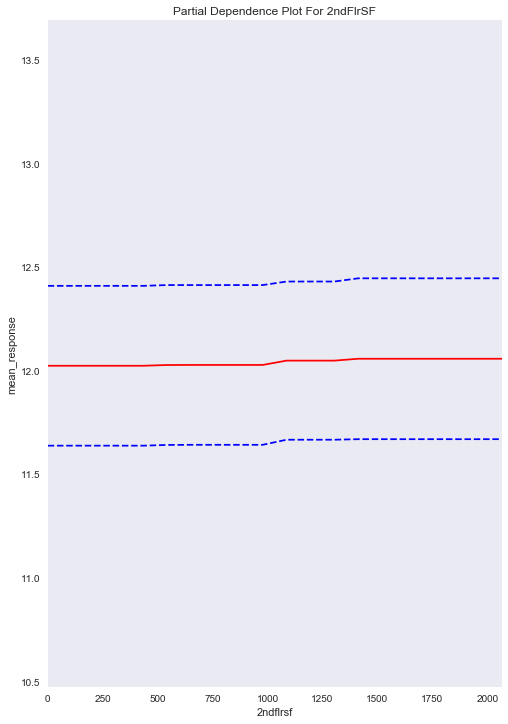

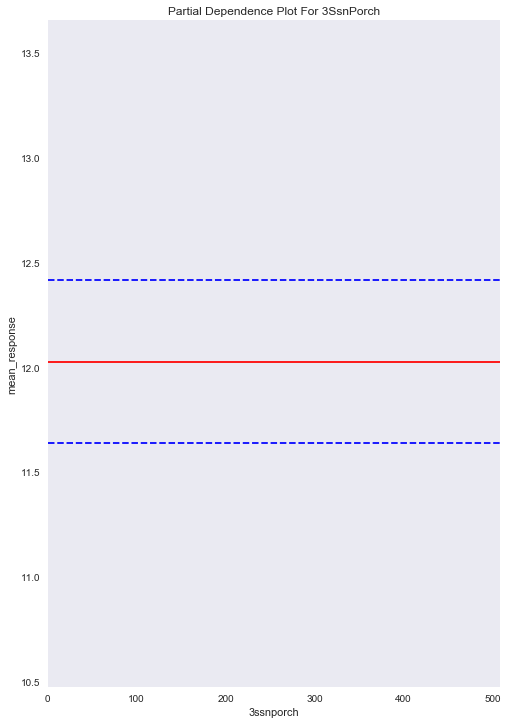

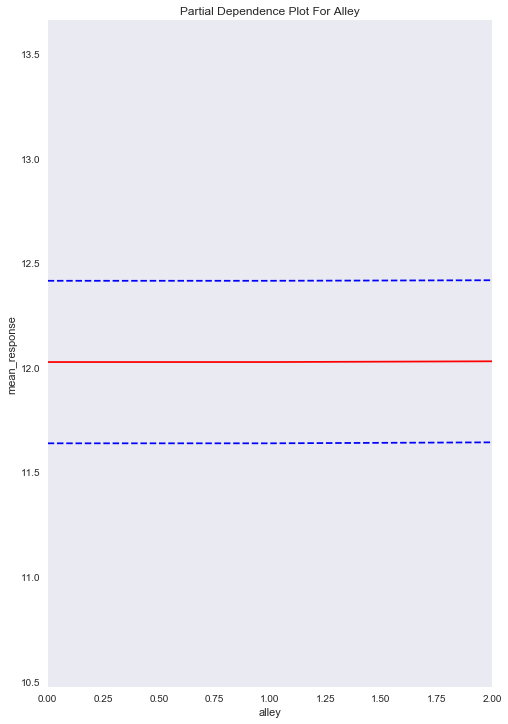

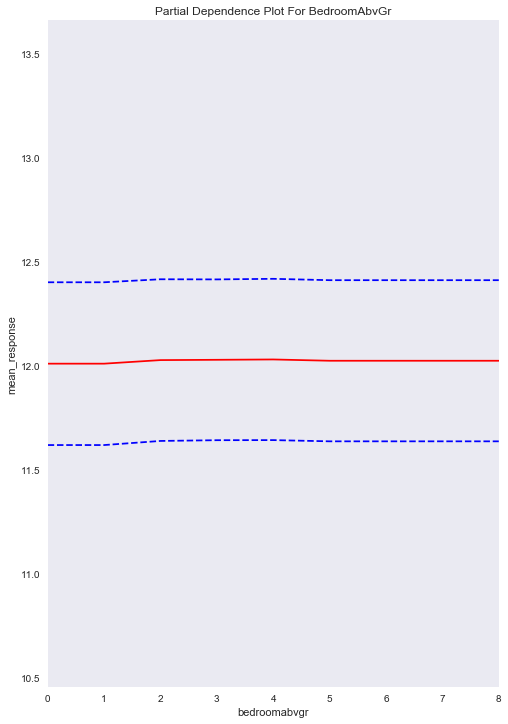

...

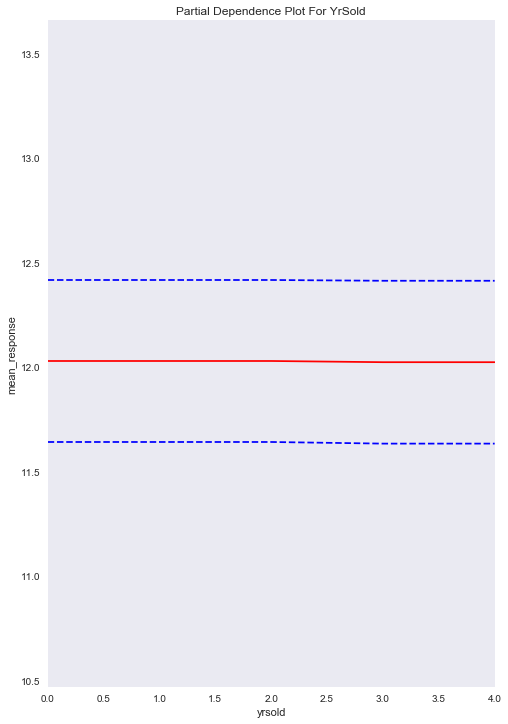

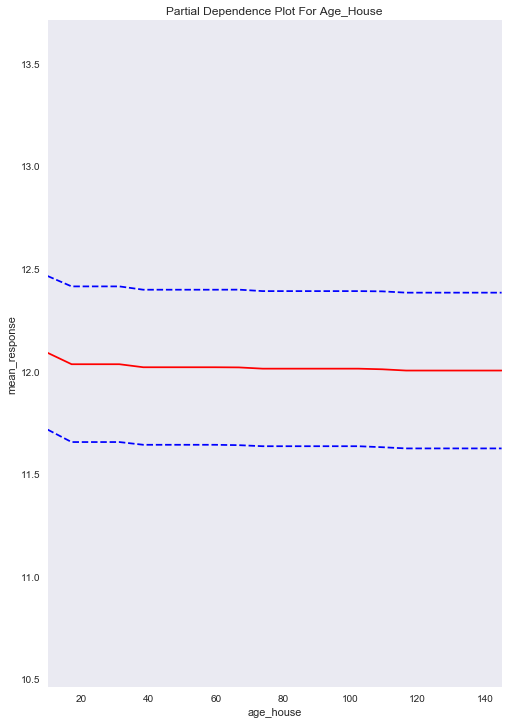

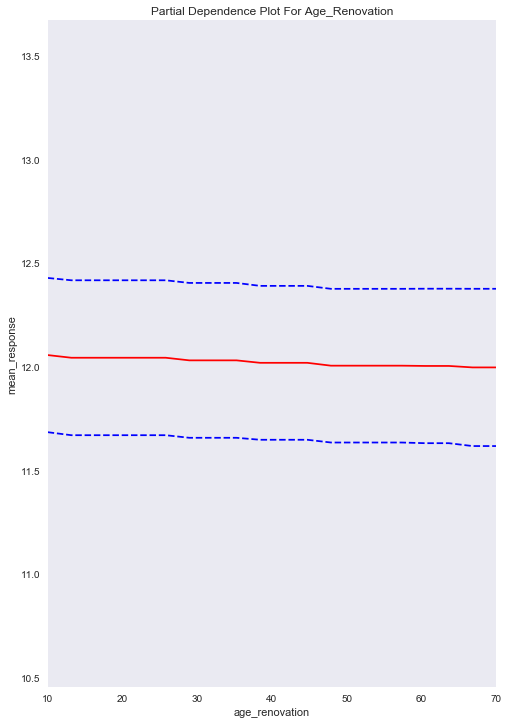

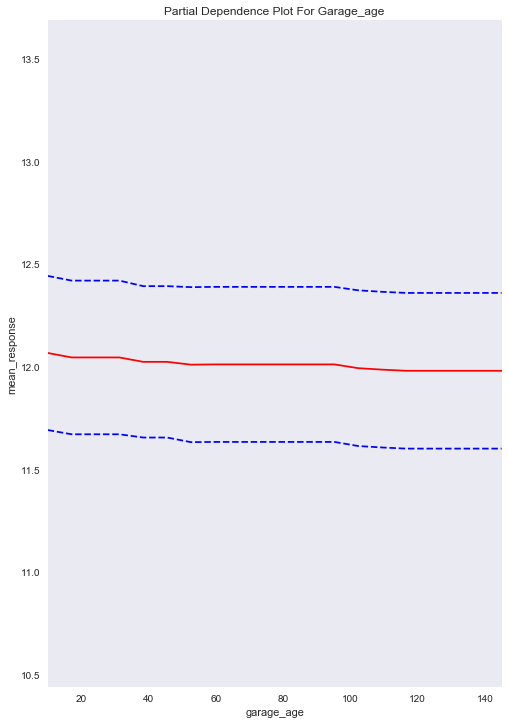

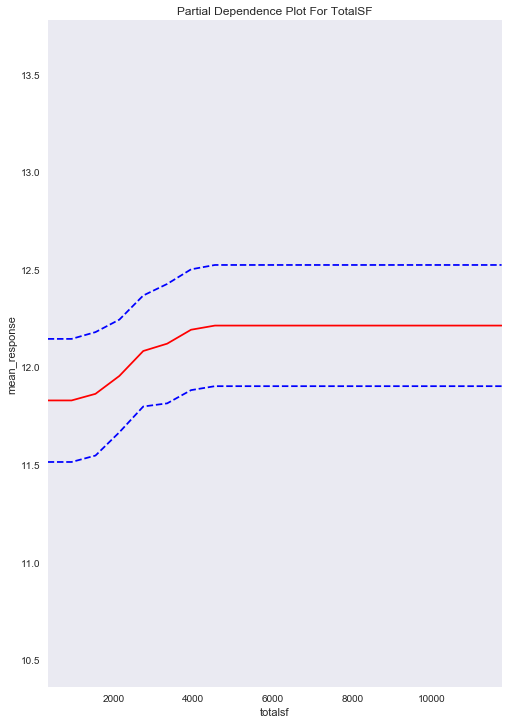

In [63]:
for i in Continuous:
    print(best_gbm_from_grid.partial_plot(data = X_train_hf, cols = [i], server=True, plot = True))


In [64]:
#print(best_model.partial_plot(data = X_train_hf, cols = ["MSZoning"], server=True, plot = True))

In [65]:
from sklearn.tree import DecisionTreeRegressor,tree
dt = DecisionTreeRegressor(max_depth=10, min_samples_leaf=0.04,
random_state=SEED)
pred_pandas = h2o.as_list(preds)
test_x_dummies = pd.get_dummies(test_x)

In [66]:
dt = dt.fit(test_x_dummies,np.exp(pred_pandas))

In [67]:
dt.score(test_x_dummies,np.exp(pred_pandas))

0.9012228157679073

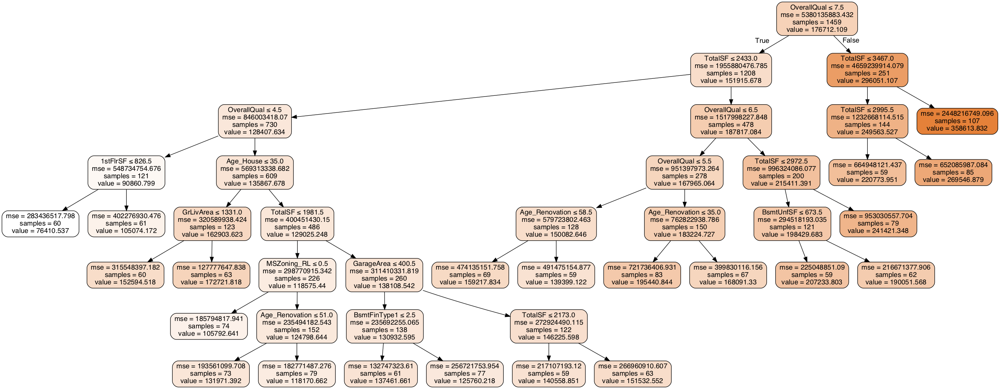

In [68]:

feature_cols = list(test_x_dummies.columns.values)

dot_data = StringIO()
export_graphviz(dt, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### SAVING THE MODEL

### RESIDUAL ANALYSIS

In [69]:
residual = np.exp(train['SalePrice']).sub(preds_train['exp(predict)'], axis = 0).abs()

In [70]:
residual = pd.DataFrame(residual,columns=['Residual'])

In [71]:
residual['SalePrice']= np.exp(train['SalePrice'])

In [72]:
residual = residual.fillna(0)

In [73]:
df = pd.concat([residual,train_x],axis=1)

In [74]:
residual.mean()

Residual      55385.327277
SalePrice    180921.195890
dtype: float64

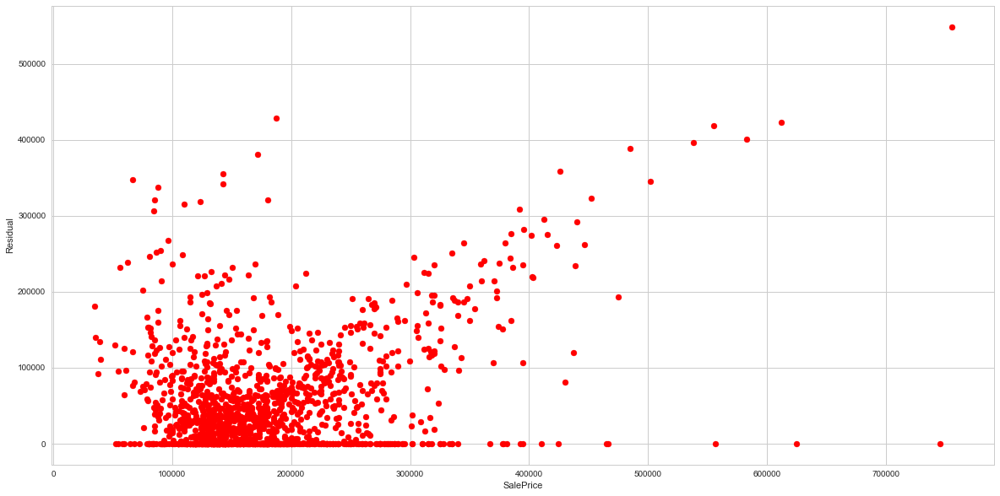

In [75]:
import matplotlib.pyplot as plt
sns.set_style('whitegrid')
fig, ax = plt.subplots(figsize=(20, 10))
plt.scatter(residual['SalePrice'],residual['Residual'],color='r')
plt.xlabel('SalePrice')
plt.ylabel('Residual')
plt.show()

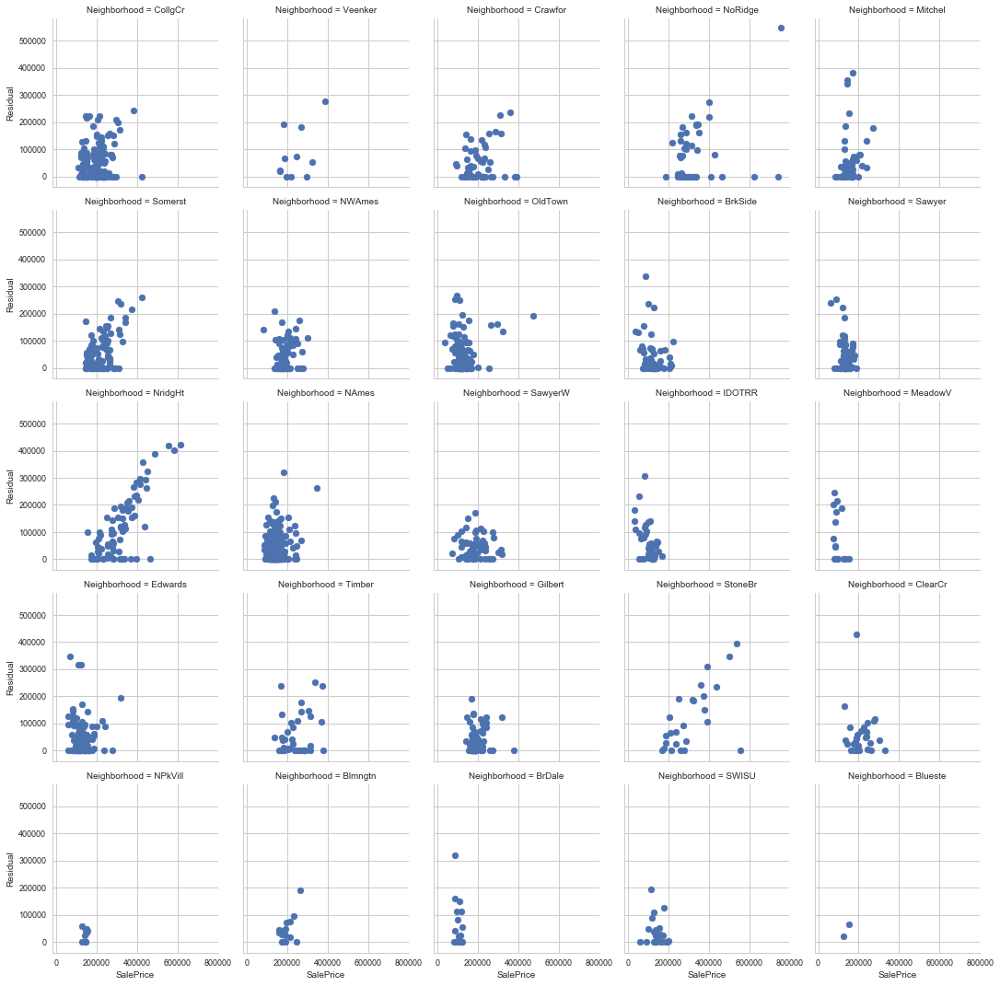

In [76]:
import seaborn as sns
sns.set(font_scale=0.9)                                         
sns.set_style('whitegrid') 

groups = df.groupby(x_names)

sorted_ = df.sort_values(by='Neighborhood') 

g=sns.FacetGrid(df, col="Neighborhood",col_wrap=5)
g= (g.map(plt.scatter, "SalePrice", "Residual").add_legend())

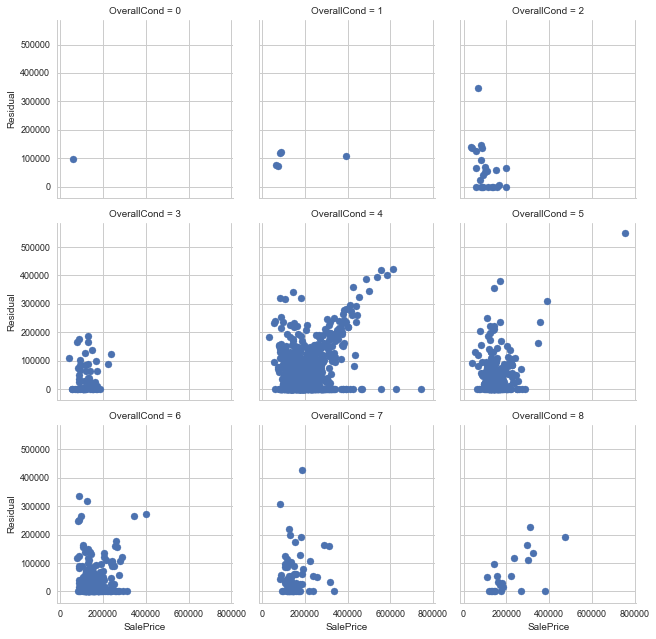

In [77]:
sns.set(font_scale=0.9)                                         
sns.set_style('whitegrid') 

groups = df.groupby(x_names)

sorted_ = df.sort_values(by='OverallCond') 

g=sns.FacetGrid(df, col="OverallCond",col_wrap=3)
g= (g.map(plt.scatter, "SalePrice", "Residual").add_legend())

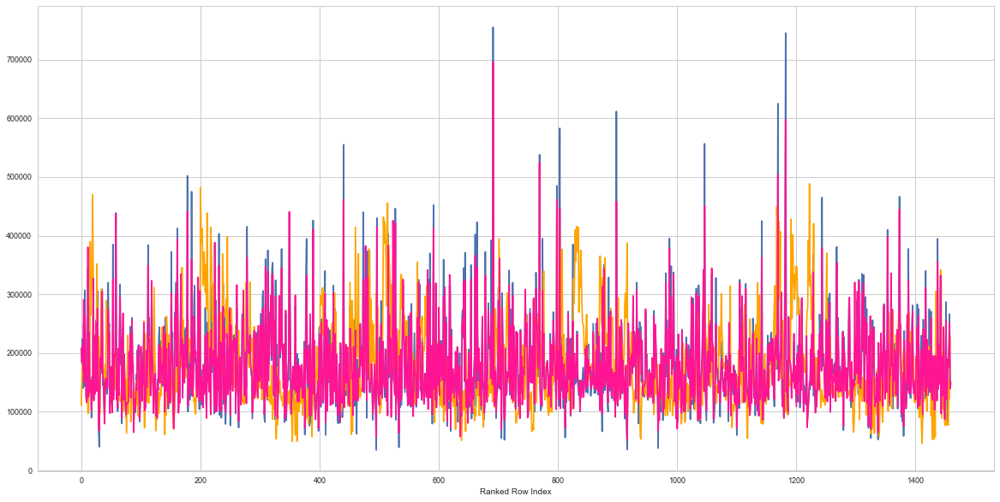

In [78]:
fig, ax = plt.subplots(figsize=(20, 10)) 
plt.plot(df['SalePrice'])
plt.plot(np.exp(pred_pandas['predict']),color='orange')
plt.plot(np.exp(pred_glm_tr['predict']),color='deeppink')
_ = ax.set_xlabel('Ranked Row Index')

[<matplotlib.lines.Line2D at 0x7fb53a785cf8>]

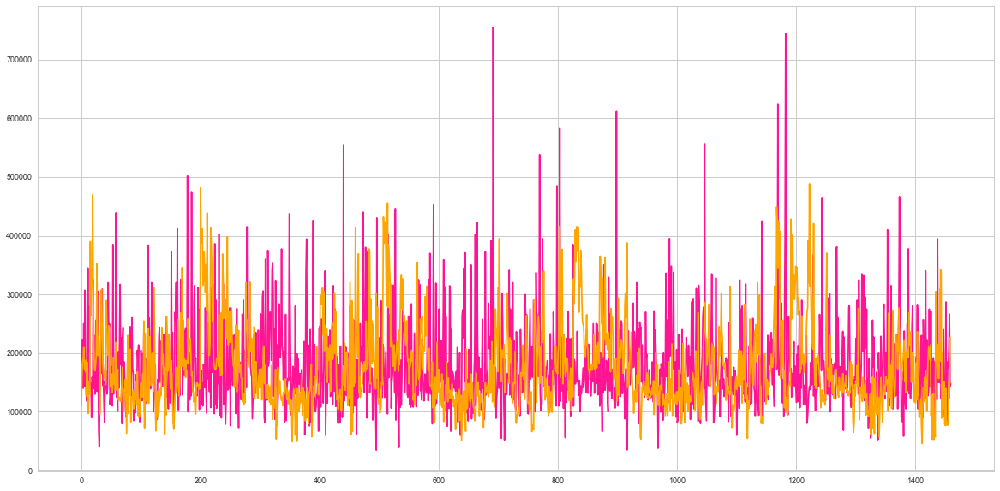

In [79]:
fig, ax = plt.subplots(figsize=(20, 10)) 
plt.plot(df['SalePrice'],color='deeppink')
plt.plot(np.exp(pred_pandas['predict']),color='orange')

[<matplotlib.lines.Line2D at 0x7fb53846eda0>]

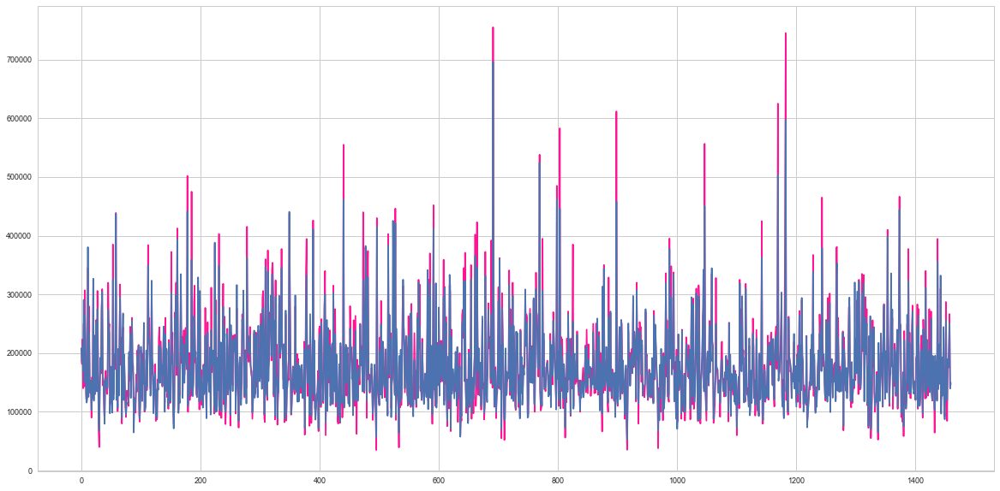

In [80]:
fig, ax = plt.subplots(figsize=(20, 10)) 
plt.plot(df['SalePrice'],color='deeppink')
plt.plot(np.exp(pred_glm_tr['predict']))